#Part 1: Unsupervised Learning (K-Means)
We use unsupervised learning on this labelled dataset to find any trends (clusters) before considering the best machine learning models to predict skipping.  

In [ ]:
# import relevant libraries

import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
import seaborn as sns

In [ ]:
# import merged dataset with no duplicates (prepared in EDA notebook)

df = pd.read_csv('merged_dataset_spotify.csv')
df.head()

,Unnamed: 0,track_id_clean,duration,release_year,us_popularity_estimate,acousticness,beat_strength,bounciness,danceability,dyn_range_mean,...,long_pause_before_play,hist_user_behavior_n_seekfwd,hist_user_behavior_n_seekback,hist_user_behavior_is_shuffle,hour_of_day,date,premium,context_type,hist_user_behavior_reason_start,hist_user_behavior_reason_end
0,0,t_a540e552-16d4-42f8-a185-232bd650ea7d,109.706673,1950,99.975414,0.458040,0.519497,0.504949,0.399767,7.511880,...,0,0,0,True,10,2018-07-15,True,user_collection,trackdone,trackdone
1,1,t_67965da0-132b-4b1e-8a69-0ef99b32287c,187.693329,1950,99.969430,0.916272,0.419223,0.545530,0.491235,9.098376,...,0,0,0,False,23,2018-07-14,True,radio,trackdone,trackdone
2,2,t_67965da0-132b-4b1e-8a69-0ef99b32287c,187.693329,1950,99.969430,0.916272,0.419223,0.545530,0.491235,9.098376,...,0,0,0,False,23,2018-07-14,True,radio,backbtn,fwdbtn
3,3,t_0614ecd3-a7d5-40a1-816e-156d5872a467,160.839996,1951,99.602549,0.812884,0.425890,0.508280,0.491625,8.368670,...,1,0,0,False,22,2018-07-14,True,user_collection,trackdone,trackdone
4,4,t_070a63a0-744a-434e-9913-a97b02926a29,175.399994,1951,99.665018,0.396854,0.400934,0.359990,0.552227,5.967346,...,1,0,0,False,20,2018-07-14,True,catalog,trackdone,endplay


Quickly plot features in 2D to detect any visual patterns or clusters

In [ ]:
print(df.columns)

Index(['Unnamed: 0', 'track_id_clean', 'duration', 'release_year',
       'us_popularity_estimate', 'acousticness', 'beat_strength', 'bounciness',
       'danceability', 'dyn_range_mean', 'energy', 'flatness',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mechanism', 'mode',
       'organism', 'speechiness', 'tempo', 'time_signature', 'valence',
       'acoustic_vector_0', 'acoustic_vector_1', 'acoustic_vector_2',
       'acoustic_vector_3', 'acoustic_vector_4', 'acoustic_vector_5',
       'acoustic_vector_6', 'acoustic_vector_7', 'session_id',
       'session_position', 'session_length', 'skip_1', 'skip_2', 'skip_3',
       'not_skipped', 'context_switch', 'no_pause_before_play',
       'short_pause_before_play', 'long_pause_before_play',
       'hist_user_behavior_n_seekfwd', 'hist_user_behavior_n_seekback',
       'hist_user_behavior_is_shuffle', 'hour_of_day', 'date', 'premium',
       'context_type', 'hist_user_behavior_reason_start',
       'hist_user_behavior_reason

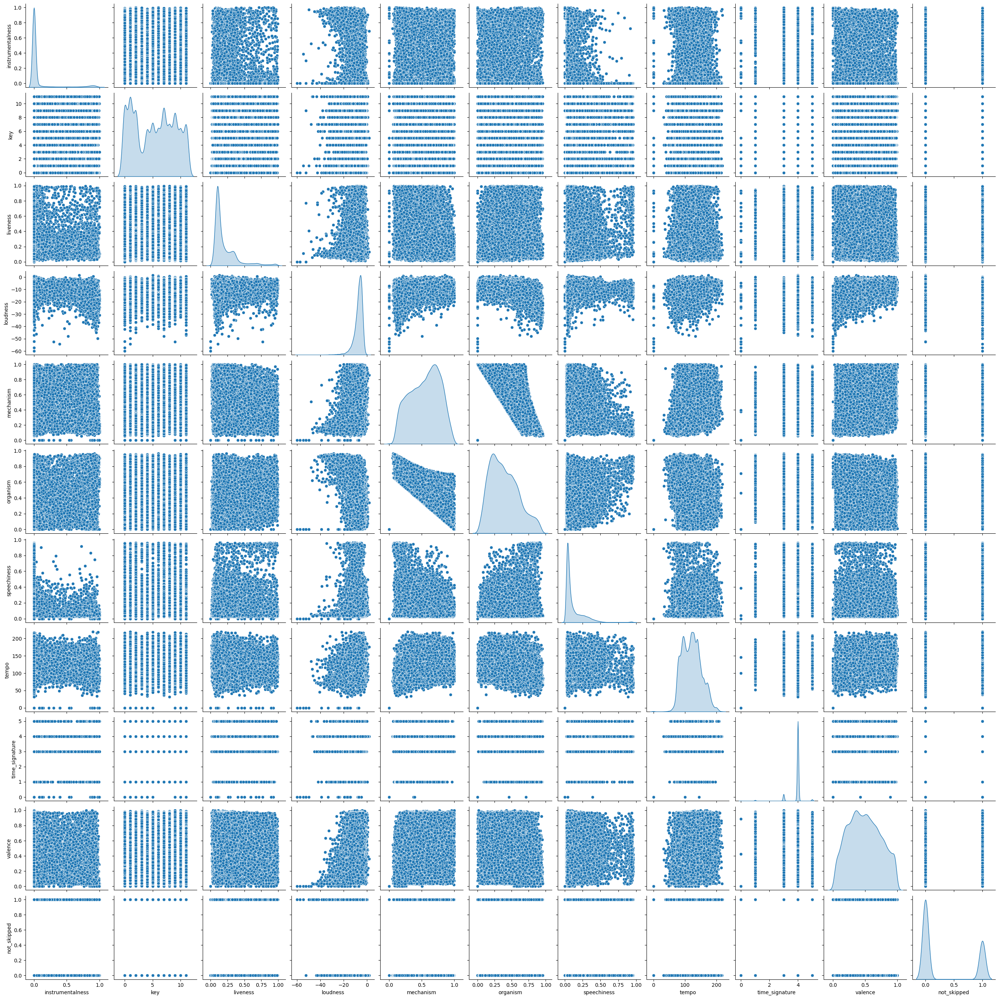

In [ ]:
sns.pairplot(df[['instrumentalness', 'key', 'liveness', 'loudness', 'mechanism', 'mode',
       'organism', 'speechiness', 'tempo', 'time_signature', 'valence','not_skipped']], diag_kind="kde")

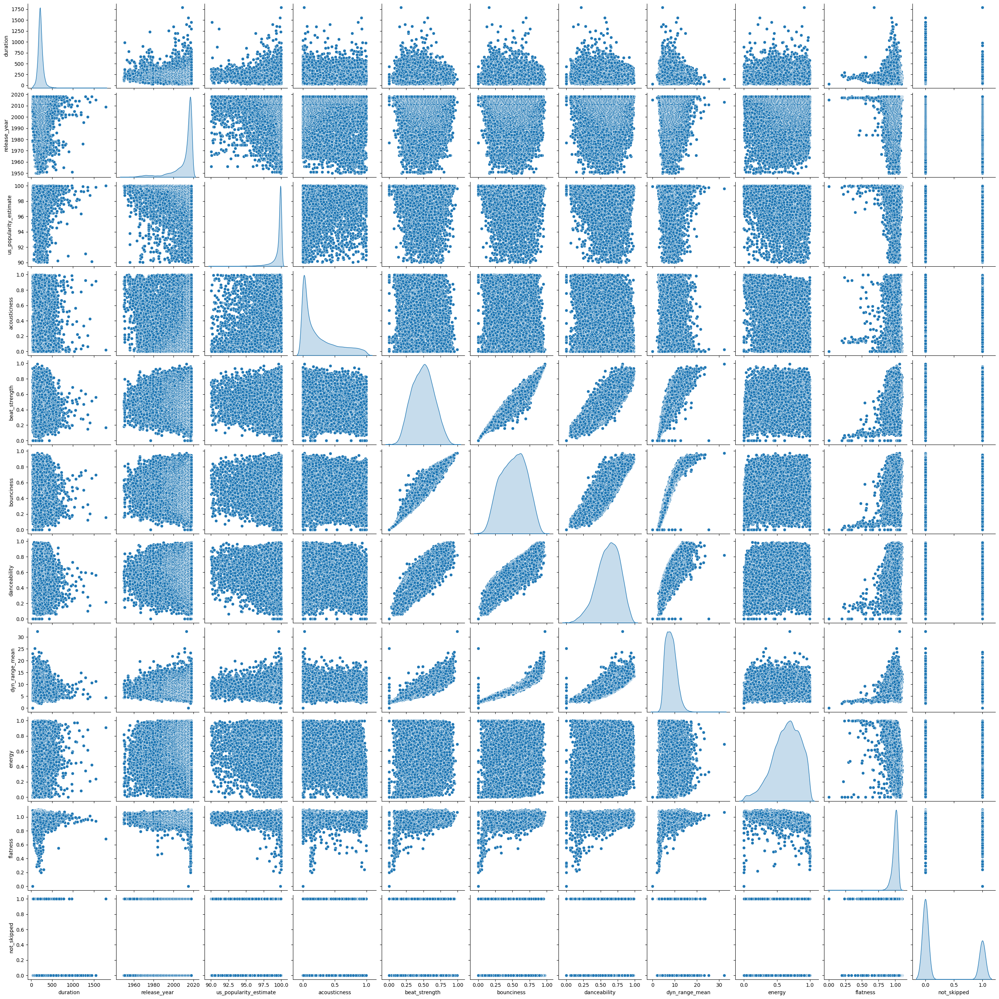

In [ ]:
sns.pairplot(df[['duration','release_year','us_popularity_estimate','acousticness','beat_strength',
                 'bounciness','danceability', 'dyn_range_mean', 'energy', 'flatness',
                 'not_skipped']], diag_kind="kde")

Nothing super obvious so far...

##Preprocessing data##

### 1. Encoding features###
Ensure that all of our features are numerical values.

In [ ]:
print(df.dtypes)

Unnamed: 0                           int64
track_id_clean                      object
duration                           float64
release_year                         int64
us_popularity_estimate             float64
acousticness                       float64
beat_strength                      float64
bounciness                         float64
danceability                       float64
dyn_range_mean                     float64
energy                             float64
flatness                           float64
instrumentalness                   float64
key                                  int64
liveness                           float64
loudness                           float64
mechanism                          float64
mode                                object
organism                           float64
speechiness                        float64
tempo                              float64
time_signature                       int64
valence                            float64
acoustic_ve

Non-numerical values:
- track_id_clean
- mode
- session_id
- skip_1, skip_2, and skip_3
- date
- premium
- context_type
- hist_user_behavior start and end

Let's take a look at what these values look like to see where to go from.

In [ ]:
non_numerical_features = ['track_id_clean', 'mode', 'session_id', 'skip_1', 'date', 'premium', 'context_type', 'hist_user_behavior_reason_start','hist_user_behavior_reason_end', 'hist_user_behavior_is_shuffle']

for feature in non_numerical_features:
  print(feature)
  print((df[feature]).unique())

track_id_clean
['t_a540e552-16d4-42f8-a185-232bd650ea7d'
 't_67965da0-132b-4b1e-8a69-0ef99b32287c'
 't_0614ecd3-a7d5-40a1-816e-156d5872a467' ...
 't_3983306d-13b4-4027-9391-7236ca93d2bf'
 't_74eb6e99-210b-440c-8d7b-4db6617d1c80'
 't_aec0dda3-19b4-4222-be07-327c12f21456']
mode
['major' 'minor']
session_id
['0_0e4a49d8-688d-4958-94db-5cb56adc3090'
 '0_0cc4863b-83ff-48cb-afda-f952ad323562'
 '0_061d77c2-5526-43b2-993c-adf4338897ce' ...
 '0_0e44b166-de6d-46de-9152-cbdc067fb56e'
 '0_07898253-6a51-4790-88f5-316f1166caa2'
 '0_06b4efdb-f2cd-40dd-9e50-fd5068c662ad']
skip_1
[False  True]
date
['2018-07-15' '2018-07-14' '2018-07-13' '2018-07-12' '2018-07-10'
 '2018-06-05' '2018-07-11' '2018-07-05' '2018-06-19' '2018-06-30'
 '2018-07-07' '2018-07-09' '2018-07-16' '2018-07-04' '2018-07-06'
 '2018-06-29' '2018-05-12' '2018-05-18']
premium
[ True False]
context_type
['user_collection' 'radio' 'catalog' 'editorial_playlist'
 'personalized_playlist' 'charts']
hist_user_behavior_reason_start
['trackdone'

Encoding strategy
- track_id and session_id: drop
- skip_1, skip_2, skip_3 <- original encoding since they depend on each other and have chronological hierarchy
- date: convert to datetime  
- mode: label encoding - "major" = 1, "minor" = 0
- premium: label encoding - "True" = 1, "False" = 0
- context type: label encoding - "user_collection" = 1, "radio" = 2, etc.
- hist_user_behavior start and end: label encoding

In [ ]:
df['skip_1'] = df['skip_1'].astype(int)
df['skip_2'] = (df['skip_2'].astype(int)) * 2 # gives all the true values of skip_2 a value of 2 instead of 1
df['skip_3'] = (df['skip_3'].astype(int)) * 3 # gives all the true values of skip_3 a value of 3 instead of 1
df['date'] = pd.to_datetime(df['date'])
df['mode'] = df['mode'].replace({'major': 1, 'minor': 0})
df['premium'] = df['premium'].astype(int)
df['context_type'] = df['context_type'].replace({
    'user_collection':1,
    'radio':2,
    'catalog':3,
    'editorial_playlist':4,
    'personalized_playlist':5,
    'charts':6})
df['hist_user_behavior_reason_start'] = df['hist_user_behavior_reason_start'].replace({
    'trackdone':1,
    'fwdbtn':2,
    'clickrow':3,
    'backbtn':4,
    'trackerror':5,
    'appload':6,
    'playbtn':7,
    'remote':8,
    'endplay':9
})
df['hist_user_behavior_reason_end'] = df['hist_user_behavior_reason_end'].replace({
    'trackdone':1,
    'endplay':2,
    'fwdbtn':3,
    'backbtn':4,
    'logout':5,
    'remote':6,
    'clickrow':7
})

df['hist_user_behavior_is_shuffle'] = df['hist_user_behavior_is_shuffle'].astype(int)

print(df.dtypes)

Unnamed: 0                                  int64
track_id_clean                             object
duration                                  float64
release_year                                int64
us_popularity_estimate                    float64
acousticness                              float64
beat_strength                             float64
bounciness                                float64
danceability                              float64
dyn_range_mean                            float64
energy                                    float64
flatness                                  float64
instrumentalness                          float64
key                                         int64
liveness                                  float64
loudness                                  float64
mechanism                                 float64
mode                                        int64
organism                                  float64
speechiness                               float64


In [ ]:
#print(df.isnull().sum())

### Plot features in 2D ###
1. Basic scatterplot

<ipython-input-9-0e0fa550bc0b>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


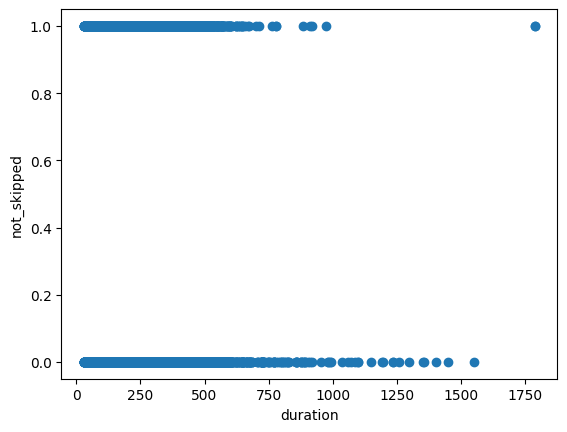

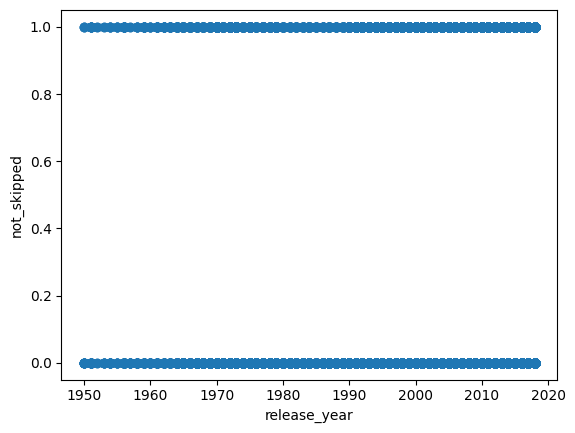

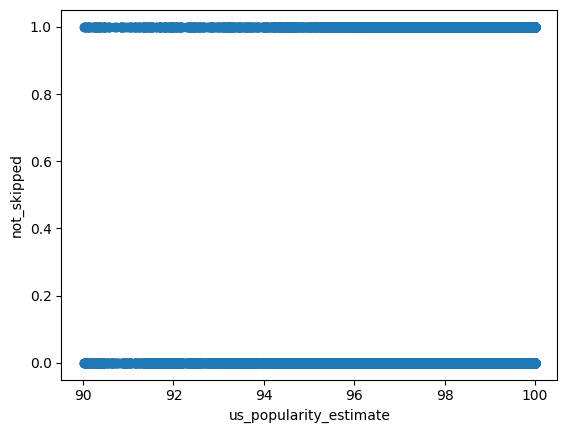

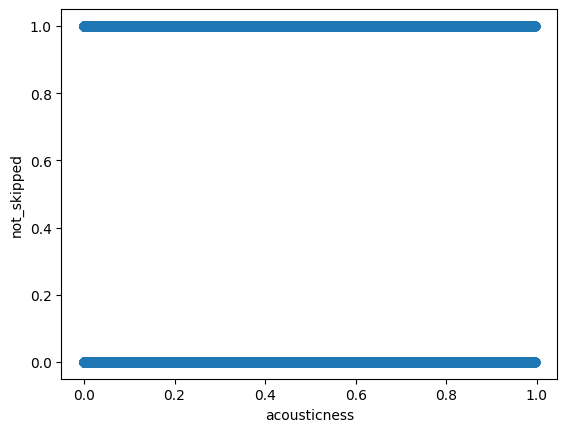

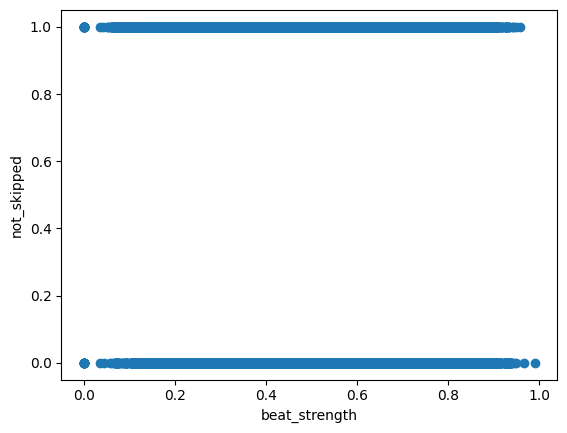

...

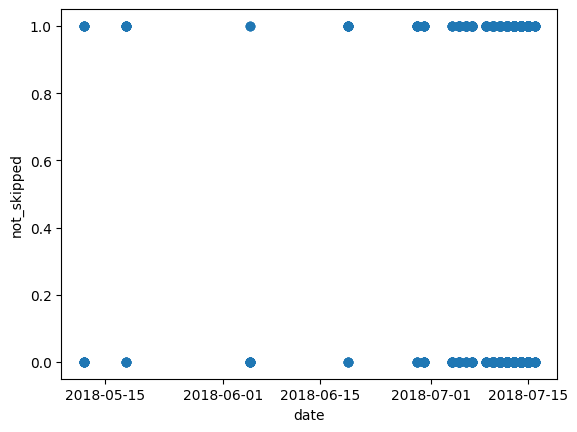

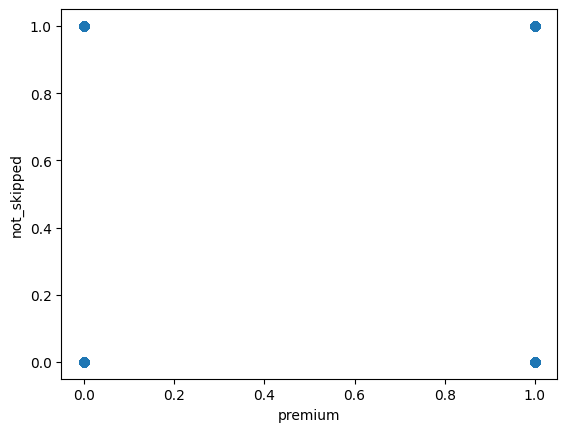

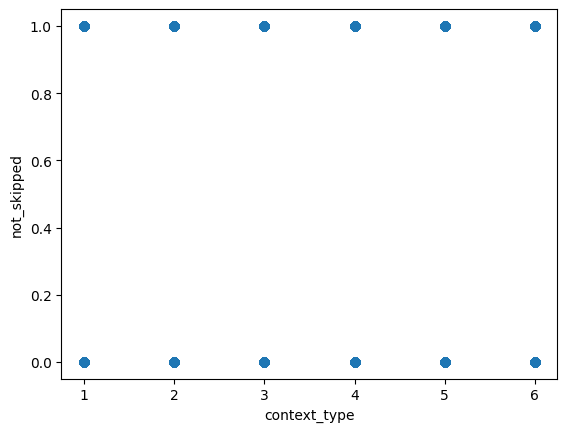

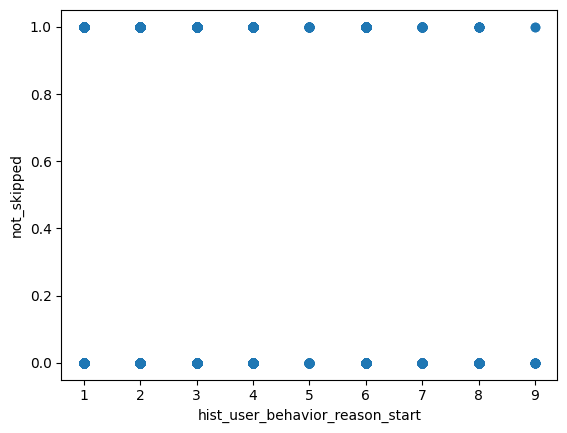

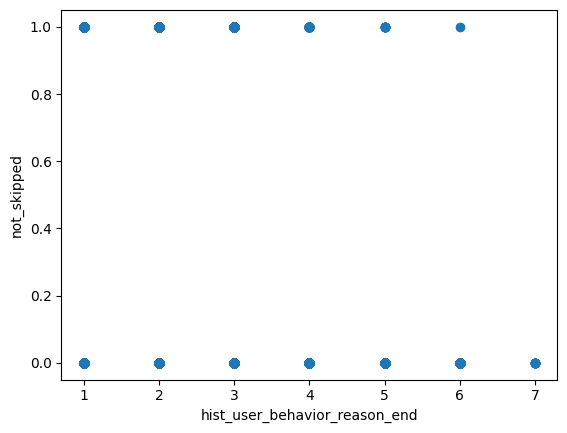

In [ ]:
to_drop = ['not_skipped', 'track_id_clean', 'session_id', 'Unnamed: 0']
features = df.columns.drop(to_drop)
#features = features.drop('session_id', 'Unnamed: 0')

import matplotlib.pyplot as plt

for i, feature in enumerate(features):
    plt.figure(i)
    plt.scatter(df[feature], df['not_skipped'])
    plt.xlabel(feature)
    plt.ylabel('not_skipped')
plt.show()

2. Violin Plot

<ipython-input-10-831f55cf218a>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


TypeError: ignored

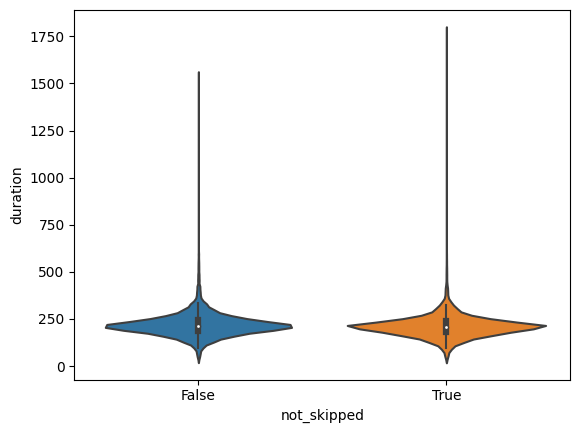

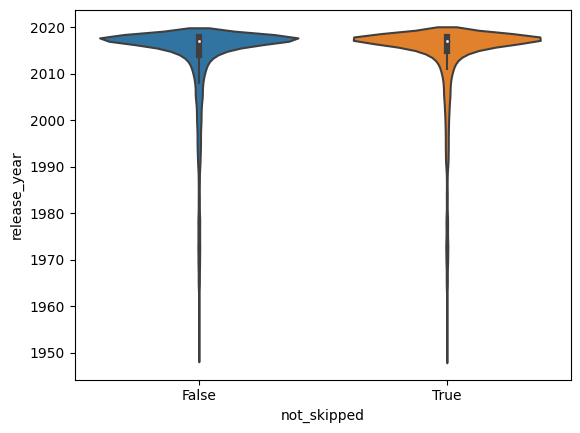

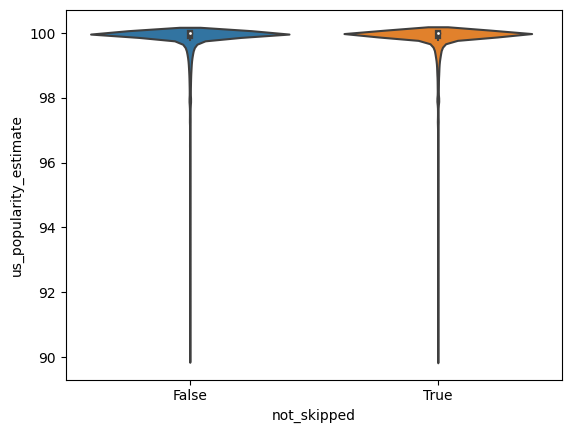

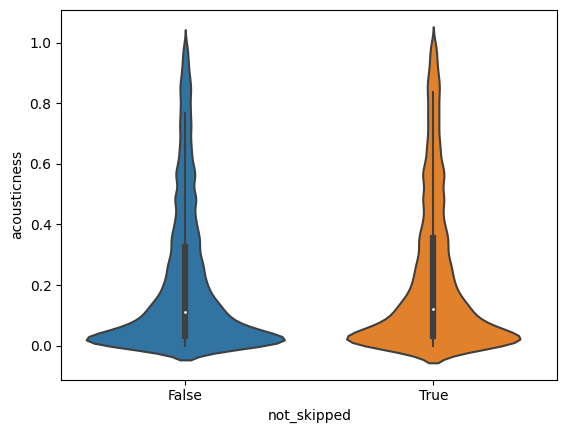

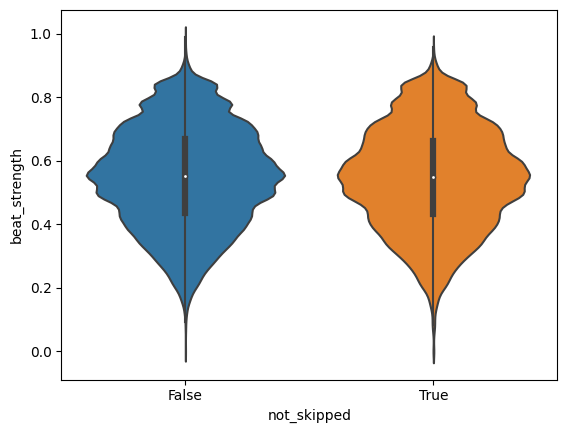

...

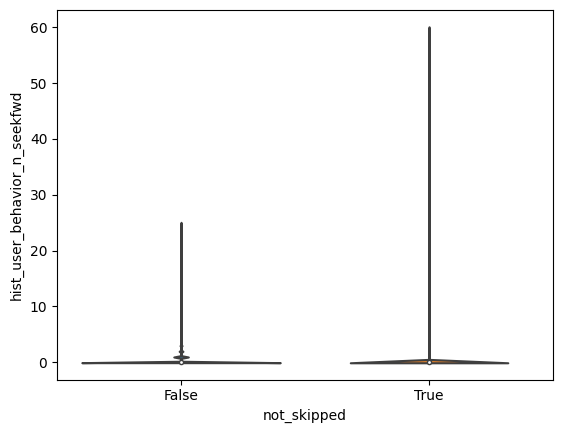

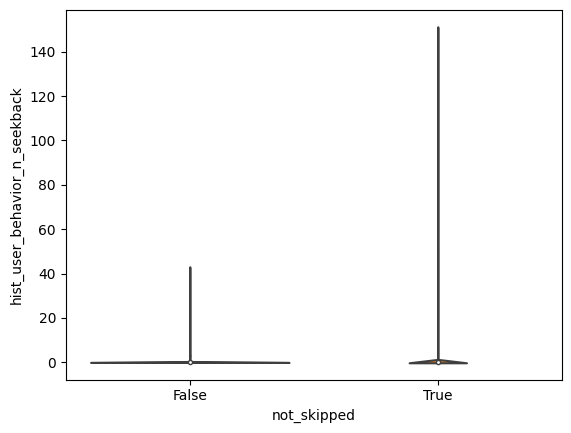

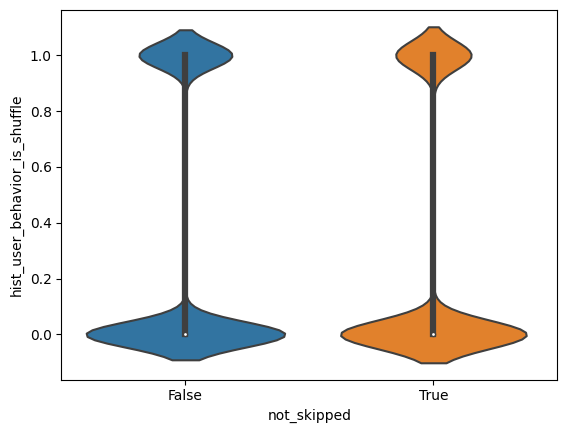

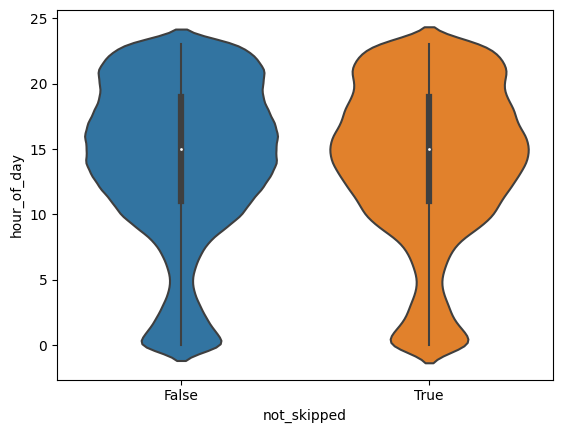

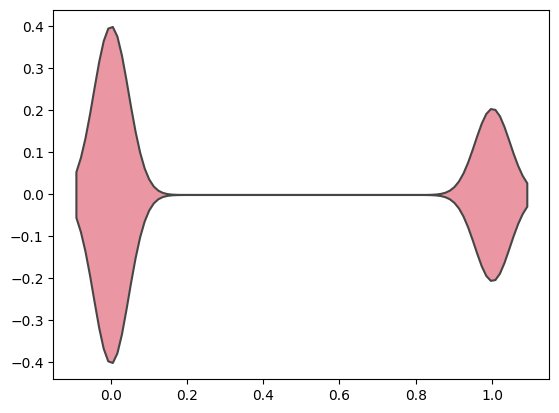

In [ ]:
for i, feature in enumerate(features):
    plt.figure(i)
    sns.violinplot(x='not_skipped', y=feature, data=df)
plt.show()

## 2. Scaling data ##

As we can see, some of our values range between 0 and 1, and other features have values that range from 1950-2000. We must scale these down so that our k-means clustering algorithm is accurate

In [ ]:
df['not_skipped'] = (df['not_skipped']).astype(int)
#df.head()

In [ ]:
df_2 = df.drop('track_id_clean', axis=1)
df_2 = df_2.drop('session_id', axis=1)
df_2 = df_2.drop('Unnamed: 0', axis=1)
#print(df_2.columns)

In [ ]:
# drop skip_1, 2, and 3 too because they are part of the target variable
df_2 = df_2.drop('skip_1', axis=1)
df_2 = df_2.drop('skip_2', axis=1)
df_2 = df_2.drop('skip_3', axis=1)
df_2 = df_2.drop('not_skipped', axis=1)

print(df_2.columns)

Index(['duration', 'release_year', 'us_popularity_estimate', 'acousticness',
       'beat_strength', 'bounciness', 'danceability', 'dyn_range_mean',
       'energy', 'flatness', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mechanism', 'mode', 'organism', 'speechiness', 'tempo',
       'time_signature', 'valence', 'acoustic_vector_0', 'acoustic_vector_1',
       'acoustic_vector_2', 'acoustic_vector_3', 'acoustic_vector_4',
       'acoustic_vector_5', 'acoustic_vector_6', 'acoustic_vector_7',
       'session_position', 'session_length', 'context_switch',
       'no_pause_before_play', 'short_pause_before_play',
       'long_pause_before_play', 'hist_user_behavior_n_seekfwd',
       'hist_user_behavior_n_seekback', 'hist_user_behavior_is_shuffle',
       'hour_of_day', 'date', 'premium', 'context_type',
       'hist_user_behavior_reason_start', 'hist_user_behavior_reason_end'],
      dtype='object')


In [ ]:
scaler = MinMaxScaler()

# all columns must be of the same type
for col in df_2.columns:
  # convert datetime to float
    if pd.api.types.is_datetime64_any_dtype(df_2[col]):
        df_2[col] = df_2[col].astype('int64') // 10**9
    else:
        df_2[col] = df_2[col].astype(float)
df_normalized = pd.DataFrame(scaler.fit_transform(df_2), columns=df_2.columns)

#K-means clustering#

In [ ]:
# let's remove the output variable just to see if the algorithm can detect skipped vs not skipped on its own

#df_normalized = df_normalized.drop('not_skipped', axis=1)

In [ ]:
km = KMeans(n_clusters=2)
y_predicted = km.fit_predict(df_normalized)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
df_normalized['not_skipped'] = df['not_skipped']
df_normalized['cluster'] = y_predicted
df_normalized.tail()

,duration,release_year,us_popularity_estimate,acousticness,beat_strength,bounciness,danceability,dyn_range_mean,energy,flatness,...,hist_user_behavior_n_seekback,hist_user_behavior_is_shuffle,hour_of_day,date,premium,context_type,hist_user_behavior_reason_start,hist_user_behavior_reason_end,not_skipped,cluster
167875,0.056374,1.0,0.990268,0.140041,0.695034,0.754398,0.863960,0.333259,0.666229,0.953415,...,0.0,0.0,0.565217,0.984615,0.0,0.0,0.125,0.333333,0,1
167876,0.056374,1.0,0.990268,0.140041,0.695034,0.754398,0.863960,0.333259,0.666229,0.953415,...,0.0,0.0,0.086957,0.984615,0.0,0.0,0.125,0.333333,0,1
167877,0.056374,1.0,0.990268,0.140041,0.695034,0.754398,0.863960,0.333259,0.666229,0.953415,...,0.0,1.0,0.956522,0.969231,1.0,0.6,0.125,0.000000,1,1
167878,0.056374,1.0,0.990268,0.140041,0.695034,0.754398,0.863960,0.333259,0.666229,0.953415,...,0.0,0.0,0.739130,0.984615,0.0,0.0,0.000,0.000000,1,1
167879,0.104495,1.0,0.996158,0.155590,0.330814,0.375821,0.528467,0.207388,0.880724,0.898502,...,0.0,0.0,0.478261,0.984615,0.0,0.2,0.125,0.000000,1,1


In [ ]:
df_normalized.head()

,duration,release_year,us_popularity_estimate,acousticness,beat_strength,bounciness,danceability,dyn_range_mean,energy,flatness,...,hist_user_behavior_n_seekback,hist_user_behavior_is_shuffle,hour_of_day,date,premium,context_type,hist_user_behavior_reason_start,hist_user_behavior_reason_end,not_skipped,cluster
0,0.045338,0.000000,0.997537,0.459974,0.524522,0.519179,0.405875,0.232258,0.817810,0.819200,...,0.0,1.0,0.434783,0.984615,1.0,0.0,0.000,0.000000,0,1
1,0.089706,0.000000,0.996937,0.920140,0.423278,0.560904,0.498740,0.281311,0.154277,0.940845,...,0.0,0.0,1.000000,0.969231,1.0,0.2,0.000,0.000000,1,1
2,0.089706,0.000000,0.996937,0.920140,0.423278,0.560904,0.498740,0.281311,0.154277,0.940845,...,0.0,0.0,1.000000,0.969231,1.0,0.2,0.375,0.333333,0,1
3,0.074429,0.014706,0.960180,0.816315,0.430010,0.522604,0.499136,0.258749,0.358857,0.910311,...,0.0,0.0,0.956522,0.969231,1.0,0.0,0.000,0.000000,1,0
4,0.082712,0.014706,0.966439,0.398530,0.404813,0.370135,0.560664,0.184503,0.514649,0.883907,...,0.0,0.0,0.869565,0.969231,1.0,0.4,0.000,0.166667,0,0


###Evaluate###

3 things to evaluate:
1. The clusters themselves (SSE)
2. The clustering compared to the actual output (getting into supervised ML territory here)
3. Trying out a different number of clusters using the "elbow technique"

In [ ]:
sse = km.inertia_
print("SSE for the 2 clusters is:")
print(sse)

SSE for the 2 clusters is:
304851.3770378861


In [ ]:
# supervised ML: accuracy
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(df_normalized['not_skipped'], df_normalized['cluster'])

print("Accuracy")
print(accuracy)

Accuracy
0.42370145341910886


In [ ]:
df_3 = df_normalized.drop('not_skipped', axis=1)
df_3.head()

,duration,release_year,us_popularity_estimate,acousticness,beat_strength,bounciness,danceability,dyn_range_mean,energy,flatness,...,hist_user_behavior_n_seekfwd,hist_user_behavior_n_seekback,hist_user_behavior_is_shuffle,hour_of_day,date,premium,context_type,hist_user_behavior_reason_start,hist_user_behavior_reason_end,cluster
0,0.045338,0.000000,0.997537,0.459974,0.524522,0.519179,0.405875,0.232258,0.817810,0.819200,...,0.0,0.0,1.0,0.434783,0.984615,1.0,0.0,0.000,0.000000,1
1,0.089706,0.000000,0.996937,0.920140,0.423278,0.560904,0.498740,0.281311,0.154277,0.940845,...,0.0,0.0,0.0,1.000000,0.969231,1.0,0.2,0.000,0.000000,1
2,0.089706,0.000000,0.996937,0.920140,0.423278,0.560904,0.498740,0.281311,0.154277,0.940845,...,0.0,0.0,0.0,1.000000,0.969231,1.0,0.2,0.375,0.333333,1
3,0.074429,0.014706,0.960180,0.816315,0.430010,0.522604,0.499136,0.258749,0.358857,0.910311,...,0.0,0.0,0.0,0.956522,0.969231,1.0,0.0,0.000,0.000000,0
4,0.082712,0.014706,0.966439,0.398530,0.404813,0.370135,0.560664,0.184503,0.514649,0.883907,...,0.0,0.0,0.0,0.869565,0.969231,1.0,0.4,0.000,0.166667,0


In [ ]:
# elbow technique
k_rng = range(1,50)
sse = []
for k in k_rng:
  km = KMeans(n_clusters=k)
  km.fit(df_3)
  sse.append(km.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

KeyboardInterrupt: ignored

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 177, in where
KeyboardInterrupt: 
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KeyboardInterrupt: ignored

In [ ]:
print(len(sse))

29


In [ ]:
print(k_rng)

range(1, 50)


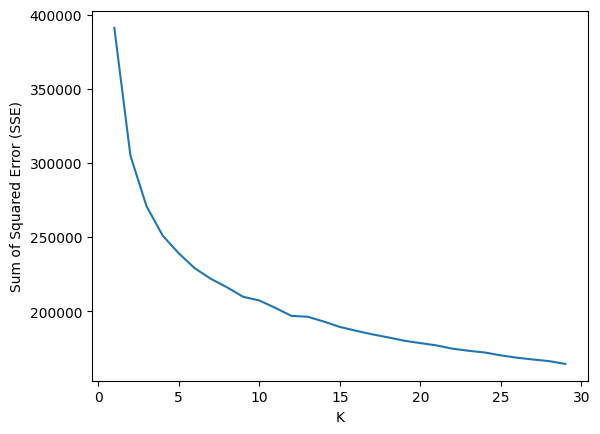

In [ ]:
plt.xlabel('K')
plt.ylabel('Sum of Squared Error (SSE)')
plt.plot(range(1,30), sse)

In [ ]:
# let's just see what the 30 clusters centroids look like
km = KMeans(n_clusters=30)
df_3.drop('cluster', axis=1, inplace=True)
km.fit_predict(df_3)


centroids = km.cluster_centers_

df_centroids = pd.DataFrame(centroids, columns = df_3.columns)
df_centroids.head()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,duration,release_year,us_popularity_estimate,acousticness,beat_strength,bounciness,danceability,dyn_range_mean,energy,flatness,...,long_pause_before_play,hist_user_behavior_n_seekfwd,hist_user_behavior_n_seekback,hist_user_behavior_is_shuffle,hour_of_day,date,premium,context_type,hist_user_behavior_reason_start,hist_user_behavior_reason_end
0,0.094503,0.819176,0.934369,0.458405,0.569319,0.628759,0.680407,0.289593,0.622898,0.909512,...,5.086470e-04,0.000136,0.000098,1.000000e+00,0.629838,0.978739,0.757884,0.297864,0.112729,0.204307
1,0.109607,0.935625,0.970927,0.303662,0.429533,0.458913,0.550703,0.227780,0.630010,0.905760,...,-5.939693e-15,0.000466,0.000150,-1.154632e-14,0.599932,0.977433,0.998407,0.275800,0.124295,0.210411
2,0.106907,0.947376,0.978189,0.162033,0.557633,0.599548,0.690157,0.280915,0.644322,0.915374,...,-2.275957e-15,0.000617,0.000334,-1.104672e-14,0.633232,0.980319,1.000000,0.291578,0.130401,0.201852
3,0.106015,0.949922,0.976986,0.195739,0.562603,0.607657,0.696878,0.284986,0.654212,0.911804,...,5.551115e-17,0.000493,0.000256,-1.004752e-14,0.629226,0.980403,1.000000,0.286635,0.125540,0.200952
4,0.108487,0.899161,0.968928,0.168926,0.525767,0.560296,0.657493,0.266209,0.668418,0.907024,...,1.000000e+00,0.000426,0.000367,1.000000e+00,0.629609,0.979643,0.999778,0.279351,0.059208,0.260095


In [ ]:
df_centroids.to_csv('df_centroids_30_1.csv')